### Set Up StyleGAN3

In [1]:
!git clone https://github.com/NVlabs/stylegan3.git

Cloning into 'stylegan3'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 212 (delta 0), reused 1 (delta 0), pack-reused 207 (from 1)
Receiving objects: 100% (212/212), 4.16 MiB | 9.80 MiB/s, done.
Resolving deltas: 100% (101/101), done.


In [2]:
%cd stylegan3

/kaggle/working/stylegan3


# Download the Pre-trained Model

In [19]:
!mkdir /kaggle/working/stylegan3/checkpoints
# get file from internet
!wget -O checkpoints/stylegan3-r-ffhq-1024x1024.pkl https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl

mkdir: cannot create directory '/kaggle/working/stylegan3/checkpoints': File exists
--2024-11-04 11:03:31--  https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 52.25.199.21, 54.201.69.48
Connecting to api.ngc.nvidia.com (api.ngc.nvidia.com)|52.25.199.21|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://xfiles.ngc.nvidia.com/org/nvidia/team/research/models/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl?versionId=lkcAsTpfp64DMXIoYIvrK4pRofRRg8F8&Expires=1730804611&Signature=apUsY0-PK8gEMskNdco2k2~S0C~gACXpNbaOTWUx~Pvlm1pXVbe9Td63nJsNTZUICetsDlvB9QqEx2MGkqaa133YhE7~m4ouv85CjYnoVYZjN1O3G78MuncQ~I~0OsqatueJ2Y~7AAS3ETknyJZV~pSqHR08JULkWKL0n5h~pDdE7XgmdJOA69I9NE86ftEMJO3S9mfn00LvUiLbtOJPqKxb~ZQQ5og1yPFqiGlbYTvIRthbIvwZ9VKxeaXsRUGacv0zeUe~5vVSpq~ikKARSgJ--RSU8Id4T1KBm~Vph4W86MNSDZotMq5FkIq5BLoN8hBHRZFB37OFN8YEtmhxgw__&Key-Pair-Id=KCX06

# Generate Images with StyleGAN3

### install dependencies

In [4]:
!pip install torch==1.13.1+cu117 torchvision==0.14.1+cu117 torchaudio==0.13.1+cu117 -f https://download.pytorch.org/whl/torch_stable.html


Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 GB 411.8 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.3/24.3 MB 57.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 76.9 MB/s eta 0:00:00:00:01
  Attempting uninstall: torch
    Found existing installation: torch 2.4.0
    Uninstalling torch-2.4.0:
      Successfully uninstalled torch-2.4.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.19.0
    Uninstalling torchvision-0.19.0:
      Successfully uninstalled torchvision-0.19.0
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 2.4.0
    Uninstalling torchaudio-2.4.0:
      Successfully uninstalled torchaudio-2.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.

In [5]:
# !apt-get install ninja-build    # Ninja est un outil de compilation rapide et léger, optimisé

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  ninja-build
0 upgraded, 1 newly installed, 0 to remove and 68 not upgraded.
Need to get 111 kB of archives.
After this operation, 358 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 ninja-build amd64 1.10.1-1 [111 kB]
Fetched 111 kB in 0s (1552 kB/s)   
Selecting previously unselected package ninja-build.
(Reading database ... 122996 files and directories currently installed.)
Preparing to unpack .../ninja-build_1.10.1-1_amd64.deb ...
Unpacking ninja-build (1.10.1-1) ...
Setting up ninja-build (1.10.1-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [6]:
import os
os.environ['TORCH_CUDA_ARCH_LIST'] = "7.5"


In [25]:
!pip install --upgrade --force-reinstall setuptools packaging

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 31.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 70.0.0
    Uninstalling setuptools-70.0.0:
      Successfully uninstalled setuptools-70.0.0
  Attempting uninstall: packaging
    Found existing installation: packaging 21.3
    Uninstalling packaging-21.3:
      Successfully uninstalled packaging-21.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf 24.8.3 requires cubinlinker, which is not installed.
cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.8.3 requires ptxcompiler, which is not installed.
cuml 24.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
dask-cudf 24.8.3 requires cupy-cuda11x>=12.0.0, which is not installed.
cudf 24.8.3

### Generate images

In [27]:
!python gen_images.py --outdir=/kaggle/working/stylegan3/out --trunc=1 --seeds=2,5,8 --network=/kaggle/working/stylegan3/checkpoints/stylegan3-r-ffhq-1024x1024.pkl

Loading networks from "/kaggle/working/stylegan3/checkpoints/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 2 (0/3) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
Generating image for seed 5 (1/3) ...
Generating image for seed 8 (2/3) ...


In [28]:
import matplotlib.pyplot as plt
import os
from PIL import Image

image_dir = 'out'

def display_image(image_dir):
  # Check if the directory contains images
    if os.path.exists(image_dir):
        images = [Image.open(os.path.join(image_dir, img)) for img in os.listdir(image_dir) if img.endswith('.png')]
        if images:
            # Display images
            fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
            for ax, img in zip(axes, images):
                ax.imshow(img)
                ax.axis('off')
            plt.show()
        else:
            print("No images found in the output directory.")
    else:
        print("Output directory does not exist.")


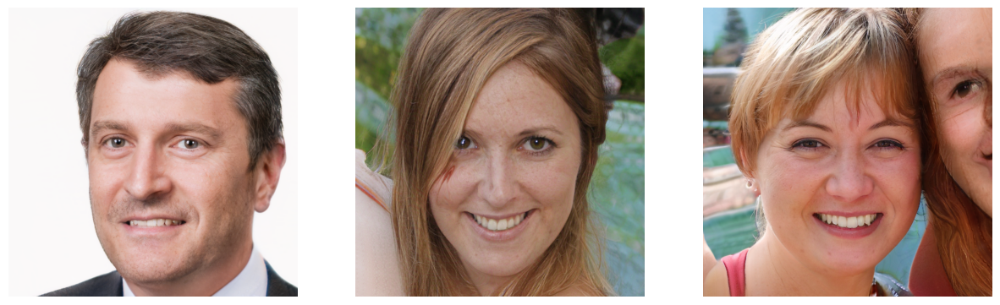

In [29]:
display_image(image_dir)

# Generate a video

In [38]:
!pip install imageio==2.9.0 tifffile==2021.7.2
!pip install imageio-ffmpeg


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 45.2 MB/s eta 0:00:00:00:0100:01


In [39]:
!python gen_video.py --output=/kaggle/working/stylegan3/out/interpolation.mp4 --seeds=2,8 --network=/kaggle/working/stylegan3/checkpoints/stylegan3-r-ffhq-1024x1024.pkl


Loading networks from "/kaggle/working/stylegan3/checkpoints/stylegan3-r-ffhq-1024x1024.pkl"...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
100%|█████████████████████████████████████████| 240/240 [00:40<00:00,  5.92it/s]


In [40]:
from IPython.display import Video

# Display the video
Video("out/interpolation.mp4", embed=True)


# Experiment with Truncation Psi


In [41]:
# Generate images with different truncation values
!python gen_images.py --outdir=out/trunc_0.5 --trunc=0.5 --seeds=2,5,8 --network=checkpoints/stylegan3-r-ffhq-1024x1024.pkl
!python gen_images.py --outdir=out/trunc_0.7 --trunc=0.7 --seeds=2,5,8 --network=checkpoints/stylegan3-r-ffhq-1024x1024.pkl
!python gen_images.py --outdir=out/trunc_1.2 --trunc=1.2 --seeds=2,5,8 --network=checkpoints/stylegan3-r-ffhq-1024x1024.pkl


Loading networks from "checkpoints/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 2 (0/3) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
Generating image for seed 5 (1/3) ...
Generating image for seed 8 (2/3) ...
Loading networks from "checkpoints/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 2 (0/3) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
Generating image for seed 5 (1/3) ...
Generating image for seed 8 (2/3) ...
Loading networks from "checkpoints/stylegan3-r-ffhq-1024x1024.pkl"...
Generating image for seed 2 (0/3) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
Generating image for seed 5 (1/3) ...
Generating image for seed 8 (2/3) ...


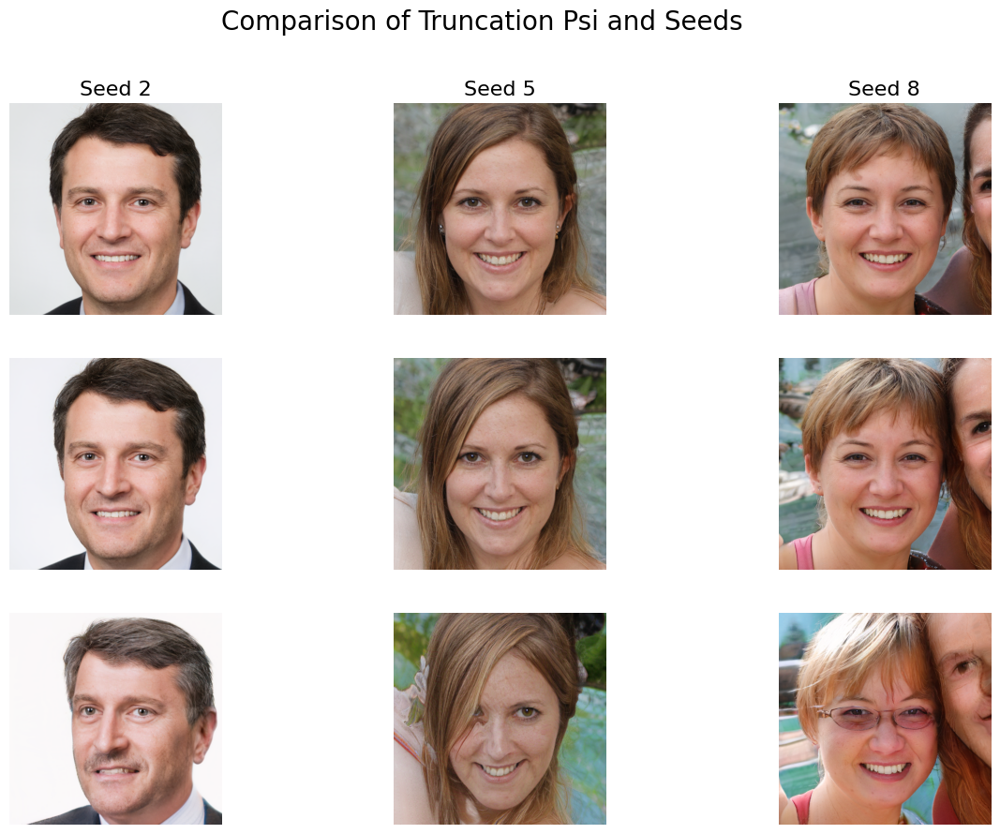

In [42]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Define output directory and image parameters
output_dirs = ["out/trunc_0.5", "out/trunc_0.7", "out/trunc_1.0"]
trunc_values = [0.5, 0.7, 1.2]
seeds = [2, 5, 8]

# Load images into a grid for comparison
fig, axs = plt.subplots(len(trunc_values), len(seeds), figsize=(15, 10))
fig.suptitle('Comparison of Truncation Psi and Seeds', fontsize=20)

for i, trunc in enumerate(trunc_values):
    for j, seed in enumerate(seeds):
        img_path = f"out/trunc_{trunc}/seed000{seed}.png"
        img = Image.open(img_path)
        axs[i, j].imshow(img)
        axs[i, j].axis('off')
        if j == 0:
            axs[i, j].set_ylabel(f"Truncation {trunc}", fontsize=16)
        if i == 0:
            axs[i, j].set_title(f"Seed {seed}", fontsize=16)

plt.show()


# Load new data to finetune the model

# Preprocess data
## Resize images


In [44]:
from PIL import Image
import os

input_folder = '/kaggle/input/highresolution-anime-face-dataset-512x512/portraits'
output_folder = '/kaggle/working/resized/images'
os.makedirs(output_folder, exist_ok=True)

for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        img = Image.open(os.path.join(input_folder, filename))
        img = img.resize((1024, 1024), Image.LANCZOS)
        img.save(os.path.join(output_folder, filename))


KeyboardInterrupt: 

## Convert to LMDB

In [48]:
!python dataset_tool.py --help

Usage: dataset_tool.py [OPTIONS]

  Convert an image dataset into a dataset archive usable with StyleGAN2 ADA
  PyTorch.

  The input dataset format is guessed from the --source argument:

  --source *_lmdb/                    Load LSUN dataset
  --source cifar-10-python.tar.gz     Load CIFAR-10 dataset
  --source train-images-idx3-ubyte.gz Load MNIST dataset
  --source path/                      Recursively load all images from path/
  --source dataset.zip                Recursively load all images from dataset.zip

  Specifying the output format and path:

  --dest /path/to/dir                 Save output files under /path/to/dir
  --dest /path/to/dataset.zip         Save output files into /path/to/dataset.zip

  The output dataset format can be either an image folder or an uncompressed
  zip archive. Zip archives makes it easier to move datasets around file
  servers and clusters, and may offer better training performance on network
  file systems.

  Images within the dataset archi

In [56]:
!python dataset_tool.py --source /kaggle/working/resized/images --dest /kaggle/working/lmdb/data.zip --max-images 1000 --transform=center-crop --resolution=512x512


100%|███████████████████████████████████████| 1000/1000 [00:40<00:00, 24.39it/s]


# Fine tune the model

In [57]:
!python train.py --help

Usage: train.py [OPTIONS]

  Train a GAN using the techniques described in the paper "Alias-Free
  Generative Adversarial Networks".

  Examples:

  # Train StyleGAN3-T for AFHQv2 using 8 GPUs.
  python train.py --outdir=~/training-runs --cfg=stylegan3-t --data=~/datasets/afhqv2-512x512.zip \
      --gpus=8 --batch=32 --gamma=8.2 --mirror=1

  # Fine-tune StyleGAN3-R for MetFaces-U using 1 GPU, starting from the pre-trained FFHQ-U pickle.
  python train.py --outdir=~/training-runs --cfg=stylegan3-r --data=~/datasets/metfacesu-1024x1024.zip \
      --gpus=8 --batch=32 --gamma=6.6 --mirror=1 --kimg=5000 --snap=5 \
      --resume=https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhqu-1024x1024.pkl

  # Train StyleGAN2 for FFHQ at 1024x1024 resolution using 8 GPUs.
  python train.py --outdir=~/training-runs --cfg=stylegan2 --data=~/datasets/ffhq-1024x1024.zip \
      --gpus=8 --batch=32 --gamma=10 --mirror=1 --aug=noaug

Options:
  --outdir DIR   

In [64]:
!python train.py --gpus 2 --data /kaggle/working/lmdb/data.zip --outdir /kaggle/working/pretrained/model.pkl --snap 1 --metrics=None --cfg stylegan3-t --batch 16 --gamma 8.2 



Training options:
{
  "G_kwargs": {
    "class_name": "training.networks_stylegan3.Generator",
    "z_dim": 512,
    "w_dim": 512,
    "mapping_kwargs": {
      "num_layers": 2
    },
    "channel_base": 32768,
    "channel_max": 512,
    "magnitude_ema_beta": 0.9994456359721023
  },
  "D_kwargs": {
    "class_name": "training.networks_stylegan2.Discriminator",
    "block_kwargs": {
      "freeze_layers": 0
    },
    "mapping_kwargs": {},
    "epilogue_kwargs": {
      "mbstd_group_size": 4
    },
    "channel_base": 32768,
    "channel_max": 512
  },
  "G_opt_kwargs": {
    "class_name": "torch.optim.Adam",
    "betas": [
      0,
      0.99
    ],
    "eps": 1e-08,
    "lr": 0.0025
  },
  "D_opt_kwargs": {
    "class_name": "torch.optim.Adam",
    "betas": [
      0,
      0.99
    ],
    "eps": 1e-08,
    "lr": 0.002
  },
  "loss_kwargs": {
    "class_name": "training.loss.StyleGAN2Loss",
    "r1_gamma": 8.2
  },
  "data_loader_kwargs": {
    "pin_memory": true,
    "prefetch_fact

In [74]:
!tensorboard --logdir /kaggle/working/pretrained/model.pkl/00001-stylegan3-t-data-gpus2-batch16-gamma8.2/ --host 0.0.0.0 --port 6006 



NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

TensorBoard 2.16.2 at http://0.0.0.0:6006/ (Press CTRL+C to quit)
^C


In [ ]:
https://[y]-6006.proxy.kaggleusercontent.com/


# Generate new images with finetuned model

In [77]:
!python gen_images.py --outdir=/kaggle/working/stylegan3/outtuned --trunc=1 --seeds=2,5,8 --network=/kaggle/working/pretrained/model.pkl/00001-stylegan3-t-data-gpus2-batch16-gamma8.2/network-snapshot-000064.pkl


Loading networks from "/kaggle/working/pretrained/model.pkl/00001-stylegan3-t-data-gpus2-batch16-gamma8.2/network-snapshot-000064.pkl"...
Generating image for seed 2 (0/3) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.
Generating image for seed 5 (1/3) ...
Generating image for seed 8 (2/3) ...


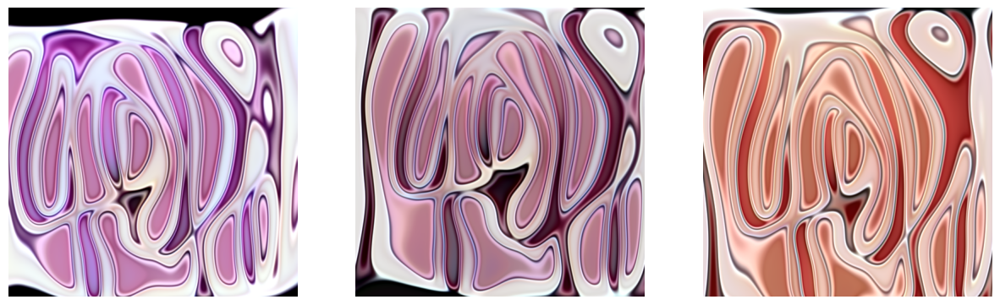

In [78]:
image_dir = 'outtuned'
display_image(image_dir)
